# Analysing behaviour via tracked `trx.mat` data
Sharbat (on 2025-04-23) has decided to split up the Jupyter Notebook dealing with both Chore and `trx.mat` file processing into two notebooks.

This notebook deals with analysing and plotting the information read from the `trx.mat` files.


In [1]:
import os
import sys
import src.data_loader as data_loader
import src.processor as processor
import matplotlib.pyplot as plt 
plt.style.use('../anemotaxis.mplstyle')
%matplotlib widget
%load_ext autoreload
%autoreload 2

# Paths
Locate and load behavioural paths

In [149]:
base_path_control = "/Users/sharbat/Projects/anemotaxis/data/FCF_attP2-40@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01948@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"
# base_path = "/Users/sharbat/Projects/anemotaxis/data/GMR_MB143B@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n"

# control
# trx_path = os.path.join(base_path_control, "20240219_143334/trx.mat")
trx_path = os.path.join(base_path_control, "20240223_112627/trx.mat")
# trx_path = os.path.join(base_path_control, "20240301_105819/trx.mat")
# trx_path = os.path.join(base_path_control, "20240301_121446/trx.mat")
# trx_path = os.path.join(base_path_control, "20240304_151714/trx.mat")
# trx_path = os.path.join(base_path_control, "20240308_104430/trx.mat")
# trx_path = os.path.join(base_path_control, "20240308_124423/trx.mat")
# trx_path = os.path.join(base_path_control, "20240304_162010/trx.mat")

# SS01757

# SS01948

# SS01696

# MB143B

# filter
date_str, extracted_data, metadata = data_loader.process_single_file(trx_path)
# all_data = data_loader.process_all_trx_files(base_path)
filtered_extracted_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
filtered_all_data_control = processor.filter_larvae_by_duration(all_data_control, min_total_duration=300)
filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=300)

### Single `trx.mat` file
This one loads a single `trx.mat` file from a single date of a single genotype for sanity checks

In [3]:
# Process a single trx.mat file
date_str, extracted_data, metadata = data_loader.process_single_file(trx_path)

# print(f"\nProcessed file metadata:")
print(f"Date: {metadata['date']}")
print(f"Number of larvae: {metadata['n_larvae']}")

Date: 2024-03-01 00:00:00
Number of larvae: 71


### All `trx.mat` file
This one loads all `trx.mat` files of both control genotype and experimental genotype

In [4]:
# Process all trx files in a directory tree
all_data_control = data_loader.process_all_trx_files(base_path_control)
all_data = data_loader.process_all_trx_files(base_path)

print(f"\nProcessed all files:")
print(f"Total experiments: {len(all_data['metadata']['experiments'])}")
print(f"Total larvae: {all_data['metadata']['total_larvae']}")  # Remove len() as total_larvae is already an integer

Found 8 trx.mat files


Processing trx files:   0%|          | 0/8 [00:00<?, ?it/s]


Processed 8 files
Total larvae: 415
Found 6 trx.mat files


Processing trx files:   0%|          | 0/6 [00:00<?, ?it/s]


Processed 6 files
Total larvae: 286

Processed all files:
Total experiments: 6
Total larvae: 286


# Filter
Filter by duration, remove small tracked paths

In [5]:
# Filter using percentile threshold (bottom 10% removed)
# filtered_data = trx_processor.filter_larvae_by_duration(extracted_data, percentile=10)

# Specify minimum duration in seconds|
filtered_extracted_data = processor.filter_larvae_by_duration(extracted_data, min_total_duration=300)
filtered_all_data_control = processor.filter_larvae_by_duration(all_data_control, min_total_duration=300)
filtered_all_data = processor.filter_larvae_by_duration(all_data, min_total_duration=300)

# Print filtering results
n_original = len(extracted_data)
n_filtered = len(filtered_extracted_data)
print(f"Filtered out {n_original - n_filtered} larvae ({(n_original - n_filtered)/n_original*100:.1f}%)")

Filtered out 50 larvae (70.4%)


# Durations

/Users/sharbat/Projects/anemotaxis/src/processor.py:506: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


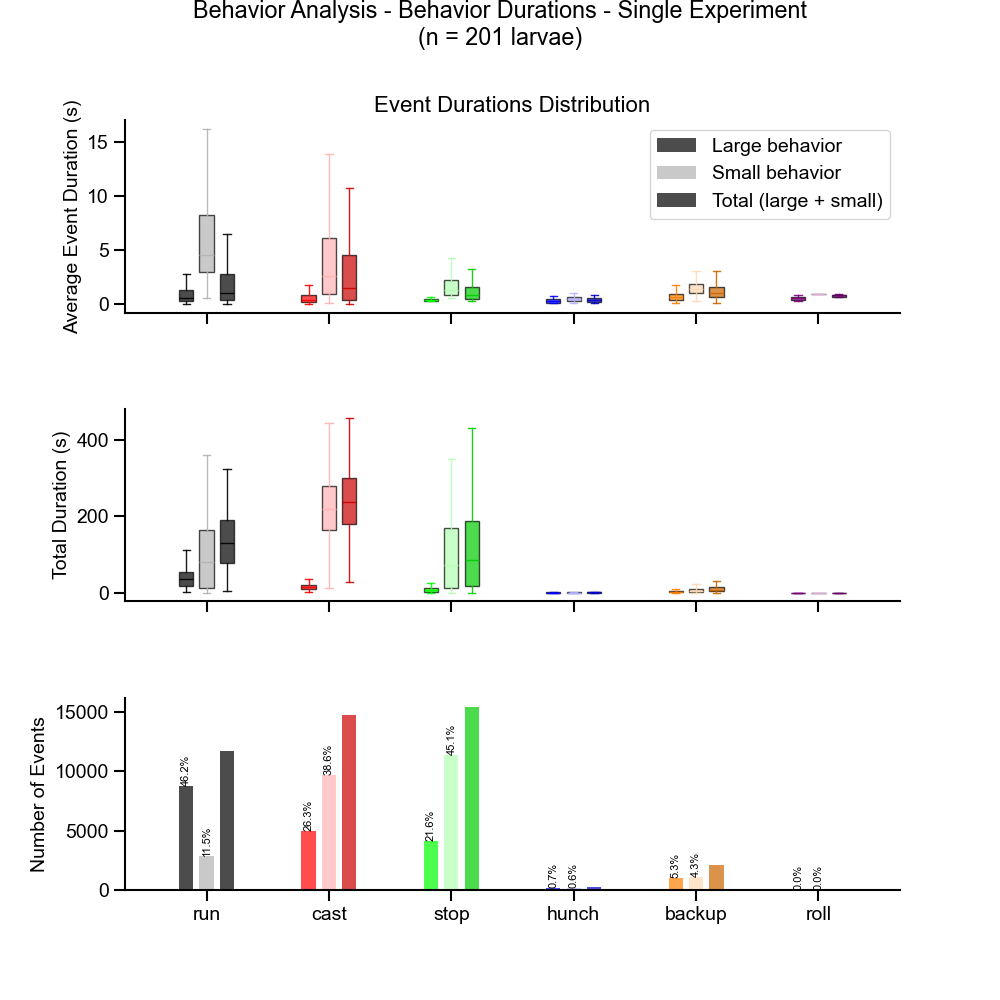


Large Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 201
Total actions: 19019

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     8783   46.2%      0.91       0.54
        cast:     4994   26.3%      0.70       0.34
        stop:     4105   21.6%      0.52       0.35
       hunch:      134    0.7%      0.29       0.25
      backup:     1001    5.3%      0.71       0.61
        roll:        2    0.0%      0.52       0.52

Small Behaviors analysis for Behavior Durations - Single Experiment
Number of larvae: 201
Total actions: 25124

    Behavior   Events  %Total      Mean(s)  Median(s)
------------------------------------------------------------
         run:     2878   11.5%      6.79       4.55
        cast:     9705   38.6%      4.63       2.59
        stop:    11319   45.1%      1.94       1.25
       hunch:      140    0.6%      0.45       0.43
      backup:     1081  

In [8]:
# For all experiments
stats = processor.analyze_behavior_durations(filtered_all_data_control, title="Behavior Durations - Single Experiment")

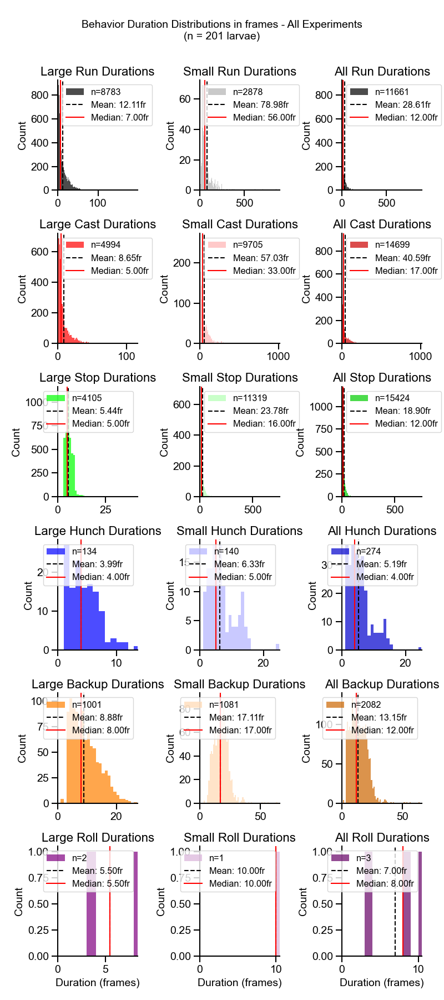


Large Behaviors duration analysis (frames) for All Experiments
Number of larvae: 201
Total actions: 19019

    Behavior   Events  %Total       Mean     Median        Std
----------------------------------------------------------------------
         run:     8783   46.2%     12.11       7.00      13.16
        cast:     4994   26.3%      8.65       5.00      10.68
        stop:     4105   21.6%      5.44       5.00       1.99
       hunch:      134    0.7%      3.99       4.00       2.53
      backup:     1001    5.3%      8.88       8.00       4.63
        roll:        2    0.0%      5.50       5.50       2.50

Small Behaviors duration analysis (frames) for All Experiments
Number of larvae: 201
Total actions: 25124

    Behavior   Events  %Total       Mean     Median        Std
----------------------------------------------------------------------
         run:     2878   11.5%     78.98      56.00      72.66
        cast:     9705   38.6%     57.03      33.00      69.85
        stop

In [35]:
stats = processor.plot_behavior_duration_histograms(filtered_all_data_control, show_plot=True, title=None, 
                                     bin_width=None, max_value=None, log_scale=False,
                                     save_path=None)
 
  

# Ethogram

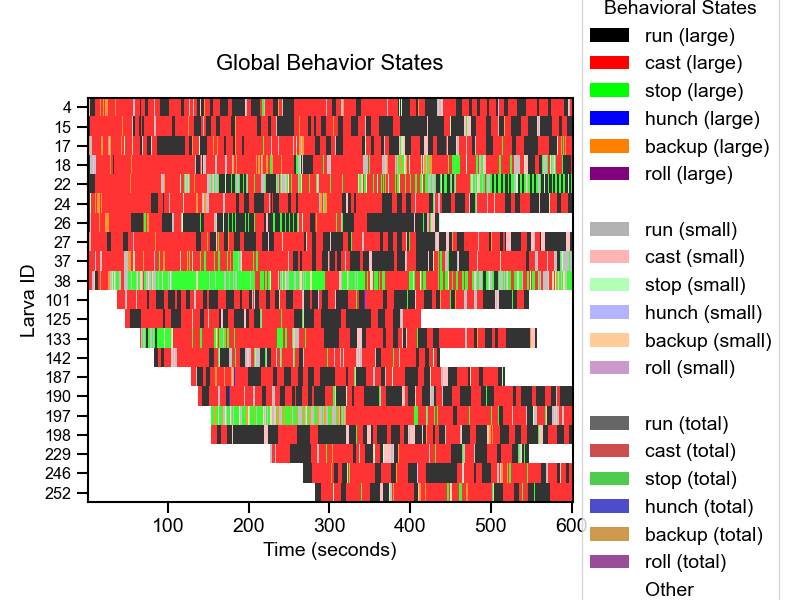

array([[[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [0.7, 1. , 0.7]],

       [[0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        ...,
        [0. , 0. , 0. ],
        [0. , 0. , 0. ],
        [0. , 0. , 0. ]],

       [[1. , 0.5, 0. ],
        [1. , 0.5, 0. ],
        [1. , 0.5, 0. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]],

       ...,

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]],

       [[1. , 1. , 1. ],
        [1. , 1. , 1. ],
        [1. , 1. , 1. ],
        ...,
        [1. , 0. , 0. ],
        [1. , 0. , 0. ],
        [1. , 0. , 0. ]]

In [34]:
# Show large, small, and total behavior rows
# trx_processor.plot_global_behavior_matrix(filtered_extracted_data, show_separate_totals=True)

# Or to show just one row per larva (original behavior)
processor.plot_global_behavior_matrix(filtered_extracted_data, show_separate_totals=False)

20240226_170838
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240226_170838/trx.mat
20240301_111323
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240301_111323/trx.mat
20240308_125815
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240308_125815/trx.mat
20240219_155844
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240219_155844/trx.mat
20240304_141357
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240304_141357/trx.mat
20240223_115010
Processing /Users/sharbat/Projects/anemotaxis/data/GMR_SS01696@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/20240223_115010/trx.mat


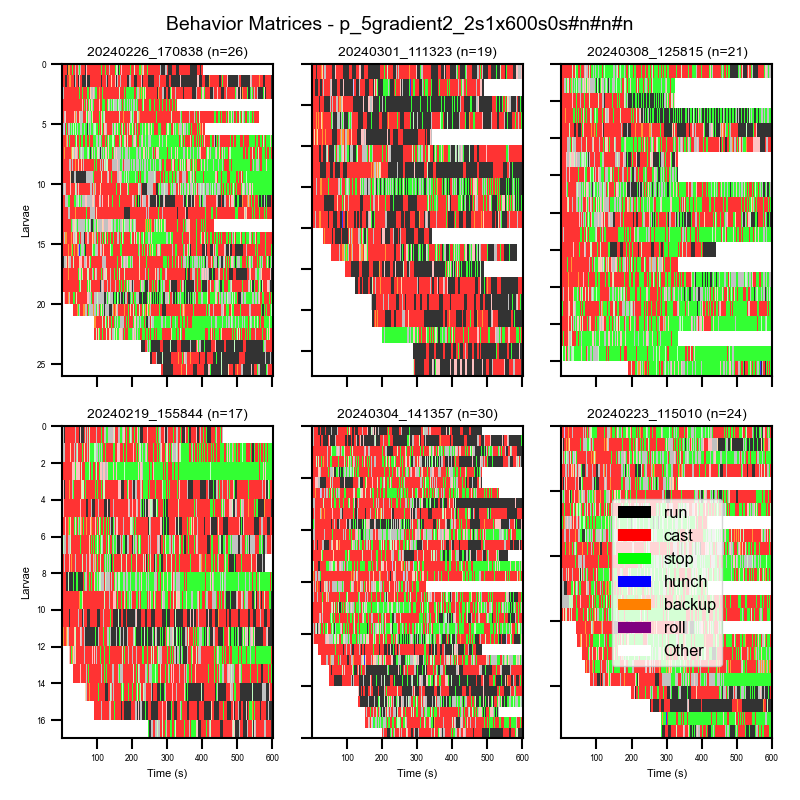

In [127]:
# Plot behavior matrices for all dates in a compact grid layout
processor.plot_behavior_matrices_for_all_dates(
    base_path=base_path,
    show_separate_totals=False,  # Set to True if you want to see large/small/total separately
    min_duration=300,
    fig_size=(8,8)
)

In [ ]:
# # Save video of the first larva's behavior
# first_larva = sorted(filtered_extracted_data.keys())[0]
# trx_processor.save_behavioral_contour_video(
#     filtered_extracted_data, 
#     first_larva,
#     output_path='../results/larva_behavior_withstates.mp4',
#     fps=20
# )

# Run statistics

## Orientation distributions during runs

In [66]:
# For all experiments
# all_exp_results = processor.analyze_run_orientations_all(filtered_all_data_control)

## Run probability as a function of orientation

In [65]:
# Calculate run probability as a function of orientationa
# run_prob_results = processor.analyze_run_rate_by_orientation(filtered_all_data_control)

## Both (polar plots)

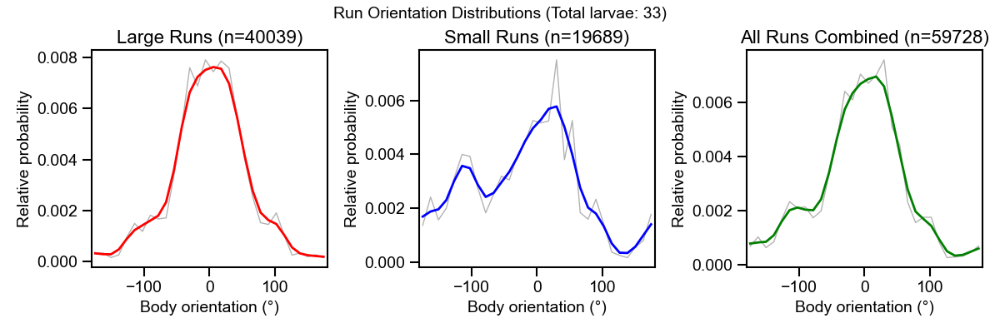

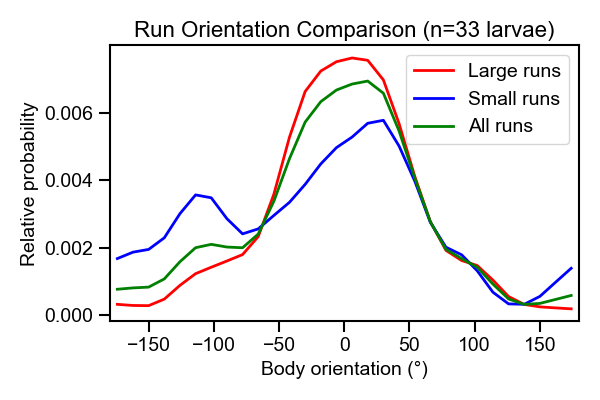

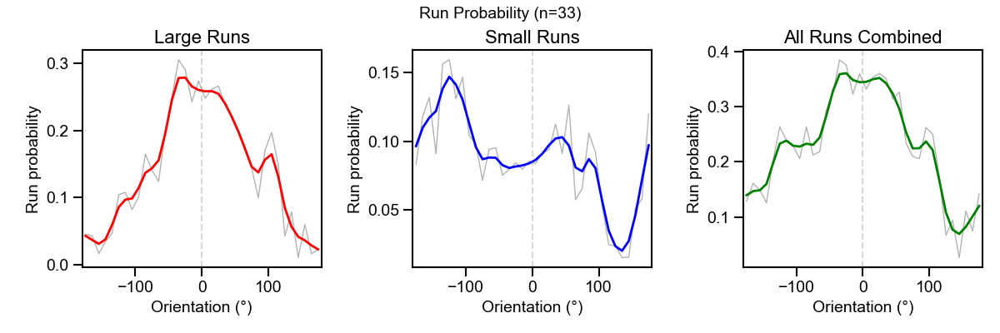

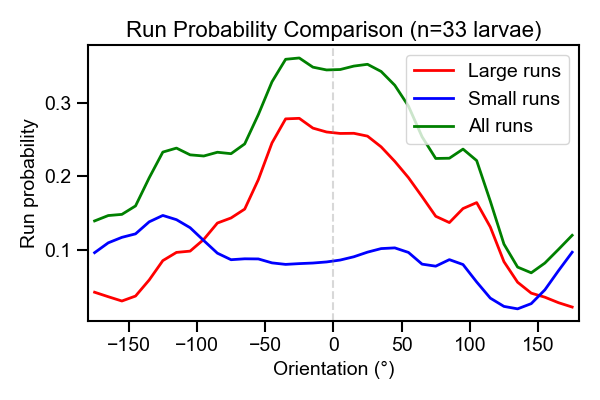

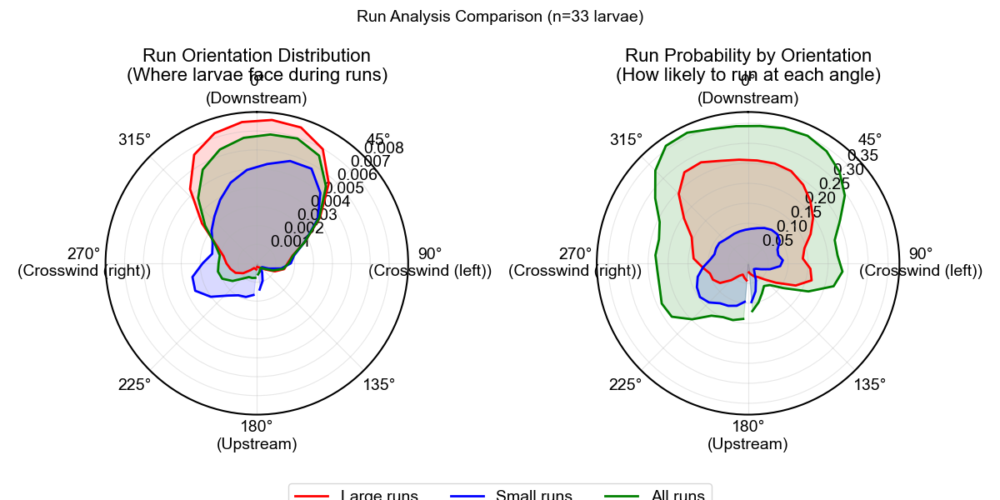

{'orientation_results': {'large_run_orientations': array([-21.12353831, -19.72364347, -20.79280443, ..., -17.89099564,
         -18.15879426, -18.4065348 ], shape=(40039,)),
  'small_run_orientations': array([-21.89340959, -22.06624876, -22.15283431, ...,  20.81792657,
          24.47090531,  23.82329047], shape=(19689,)),
  'all_run_orientations': array([-21.12353831, -19.72364347, -20.79280443, ...,  20.81792657,
          24.47090531,  23.82329047], shape=(59728,)),
  'hist_large': array([0.00033925, 0.00033717, 0.00016442, 0.00026641, 0.00095324,
         0.00150062, 0.00118426, 0.00182114, 0.00167545, 0.00171708,
         0.00338004, 0.00530316, 0.00760092, 0.00688495, 0.00790687,
         0.00744274, 0.007859  , 0.00758427, 0.00571734, 0.00399402,
         0.00253711, 0.00152768, 0.00145899, 0.00191064, 0.00104273,
         0.00025808, 0.00034133, 0.00019356, 0.00027265, 0.00015818]),
  'hist_small': array([0.00135863, 0.00240828, 0.00156179, 0.00199773, 0.00311934,
         0.00

In [111]:
processor.plot_polar_run_types_comparison(filtered_extracted_data, bin_width=10, save_path=None)

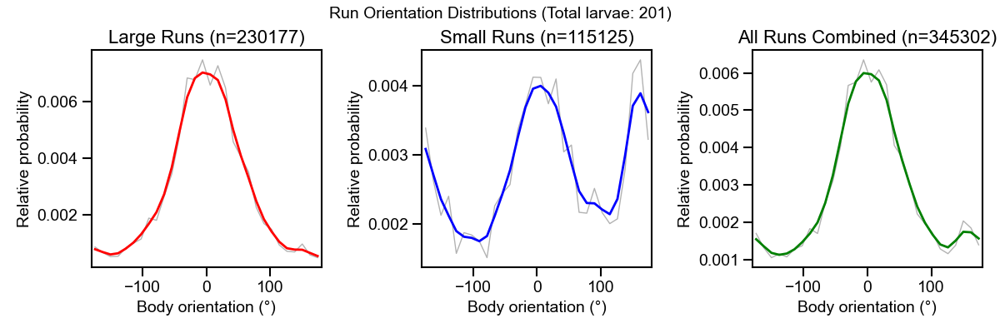

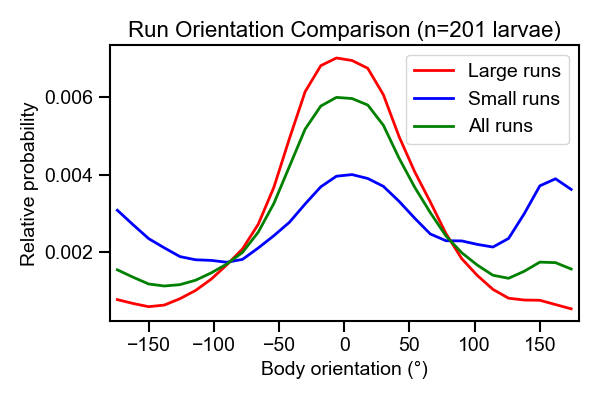

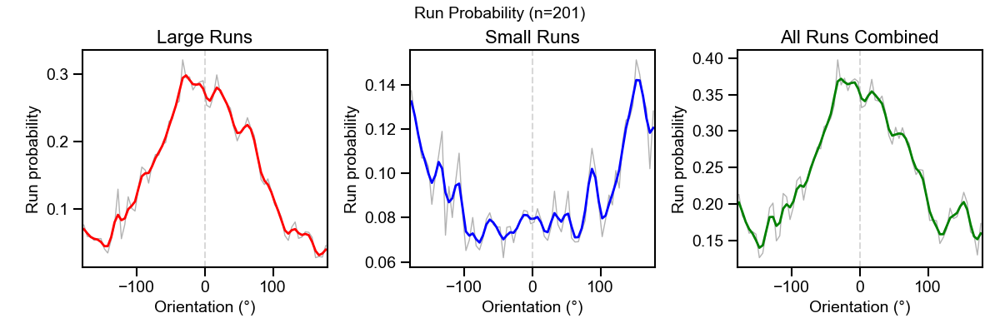

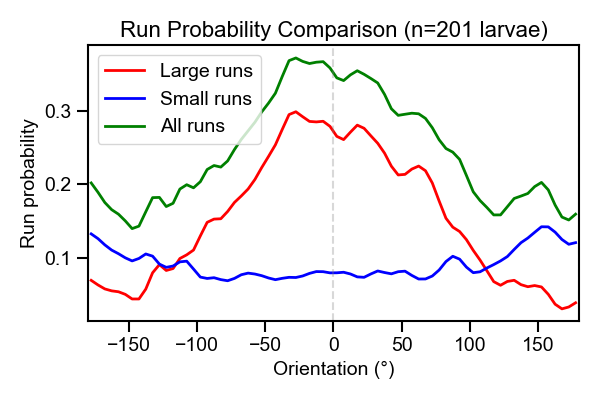

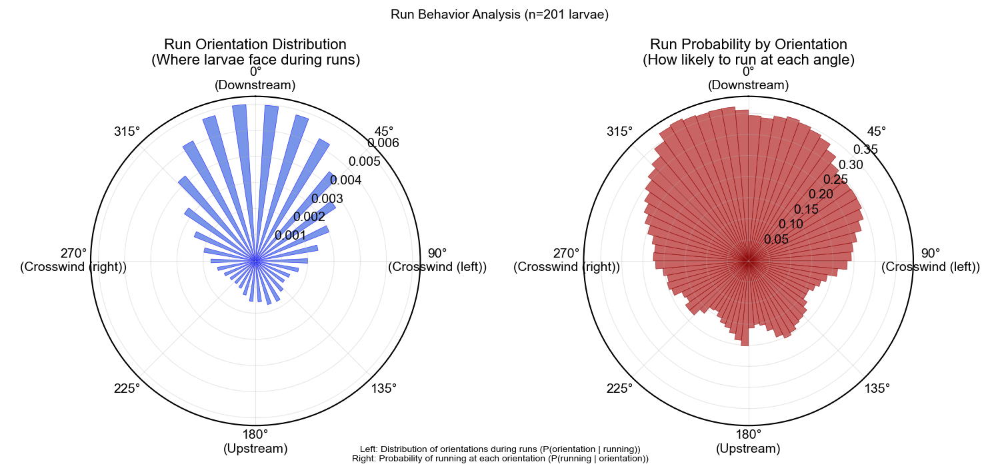

In [112]:
# Plot run analysis with polar histograms
results = processor.plot_polar_run_histograms(
    filtered_all_data_control, 
    bin_width=5,
    save_path="/Users/sharbat/Projects/anemotaxis/results/figures/run_polar_histograms.png"
)

# Cast (sweep + turn) statistics

# Sub-dividing `cast`

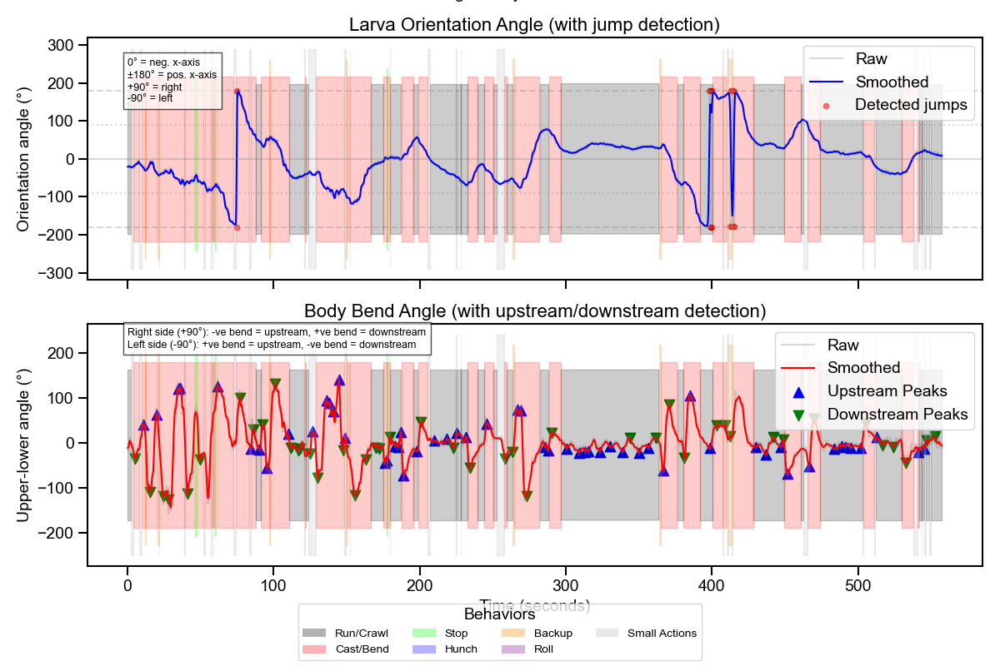

In [113]:
first_larva = sorted(filtered_extracted_data.keys())[0]
results = processor.plot_filtered_angles(
    filtered_extracted_data,  # Your tracking data
    larva_id=first_larva,     # Specific larva or None for random
    smooth_window=15,          # Smoothing strength
    jump_threshold=50         # Degrees per frame threshold for jumps
)

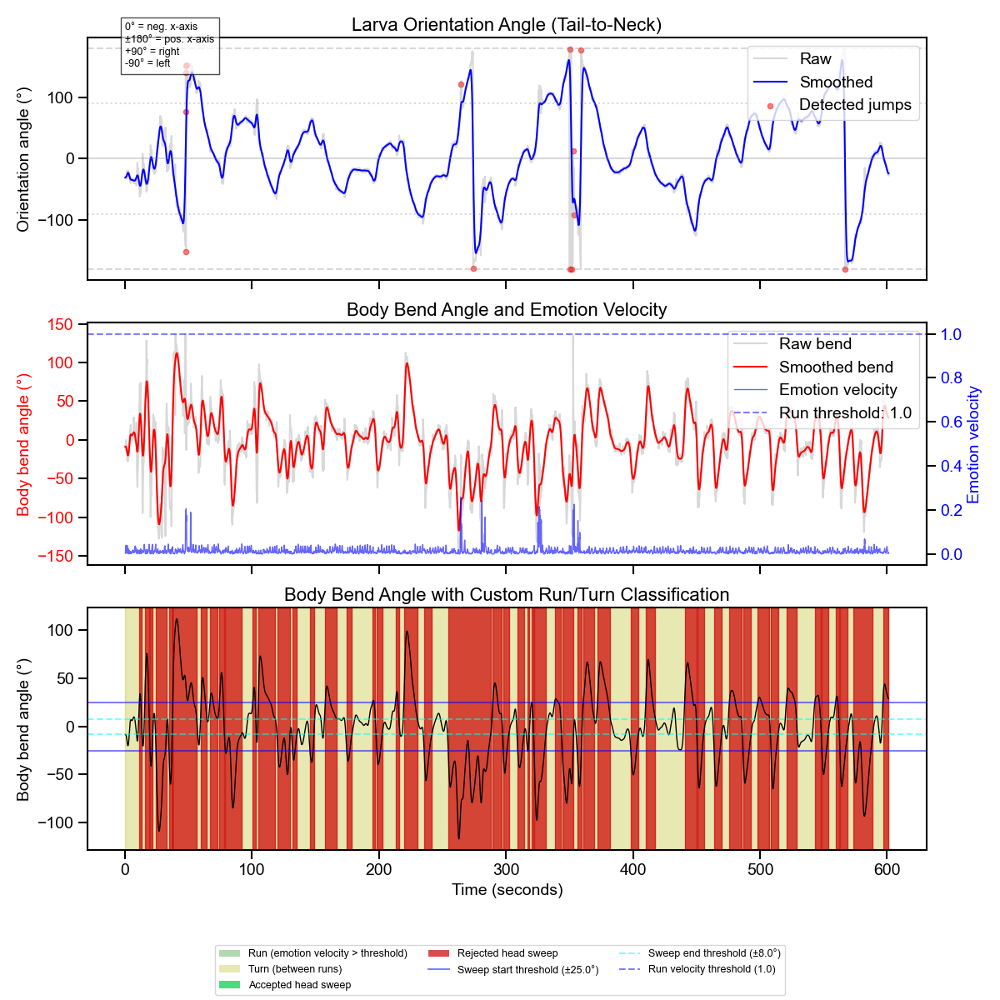

In [19]:
# Example call with custom thresholds, including velocity threshold
results = processor.plot_filtered_angles_enhanced(
    filtered_extracted_data,
    larva_id=first_larva,
    smooth_window=30,
    jump_threshold=50,
    sweep_start_threshold=25.0,  # Head sweep start threshold (degrees)
    sweep_end_threshold=8.0,     # Head sweep end threshold (degrees)
    velocity_run_threshold=1.0   # Run definition threshold (velocity units)
)

In [ ]:
# With default parameters
# results = trx_processor.plot_combined_behavioral_analysis(filtered_extracted_data)

# With custom parameters
# results = trx_processor.plot_combined_behavioral_analysis(
#     filtered_extracted_data, 
#     larva_id=first_larva,
#     smooth_window=30,           # Add this parameter
#     jump_threshold=50,          # Add this parameter
#     sweep_start_threshold=12.0,
#     sweep_end_threshold=8.0,
#     velocity_run_threshold=0.6
# )

In [79]:
all_cast_peaks = processor.detect_cast_peaks(filtered_all_data_control)

Detected 0 cast peaks across 0 larvae
First peaks: 0.0 (nan%), Last peaks: 0.0 (nan%)
Accepted peaks: 0.0 (nan%)


/Users/sharbat/Projects/anemotaxis/src/processor.py:6676: RuntimeWarning: invalid value encountered in scalar divide
  plt.figure(figsize=(6, 4))
/Users/sharbat/Projects/anemotaxis/src/processor.py:6677: RuntimeWarning: invalid value encountered in scalar divide
  


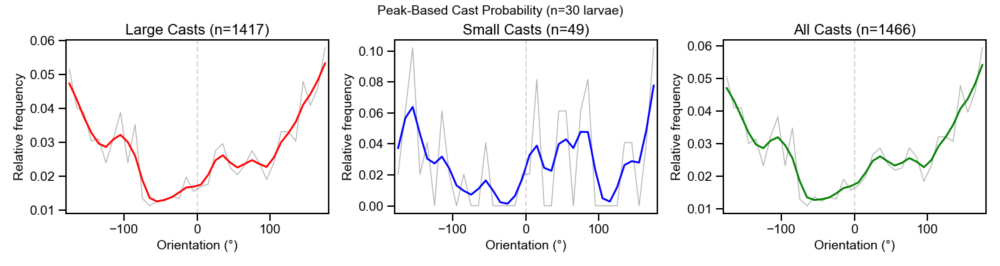

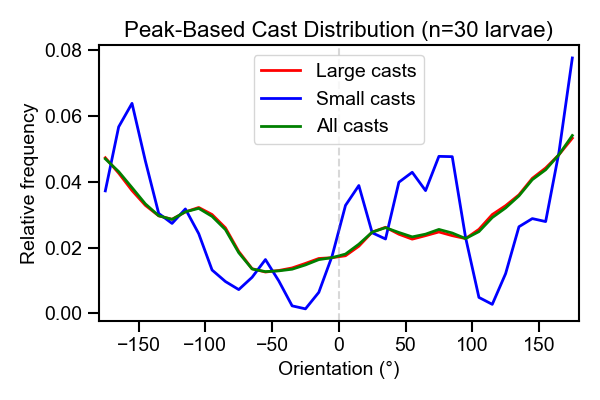

In [150]:
# Analyze all data
all_cast_ = processor.analyze_turn_rate_by_orientation_new(filtered_extracted_data, larva_id=None, bin_width=10, 
                                    smooth_window=5, jump_threshold=15, 
                                    peak_threshold=5, peak_prominence=3)

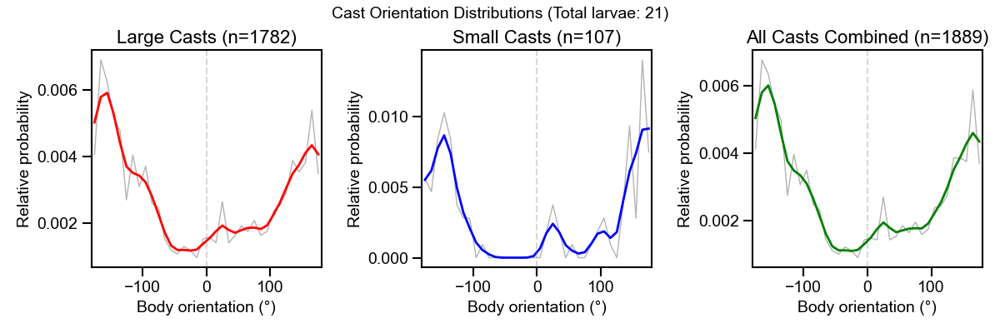

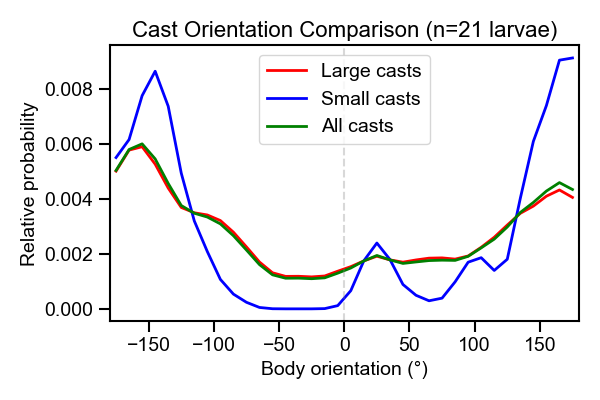

In [137]:
# Example usage
cast_results = processor.analyze_cast_orientations_all_new(filtered_extracted_data)


## IMP : CHECK THE CAST DIRECTION NEGATIVE/POSITIVE VALUE!!!

# Cast Direction

Analyzing Control...
Error processing larva 20240308_124423_506: ufunc 'degrees' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''


/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


Analyzing Experimental...
Error processing larva 20240308_131239_118: ufunc 'degrees' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
Error processing larva 20240226_152833_23: ufunc 'degrees' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
Creating comparison plots...


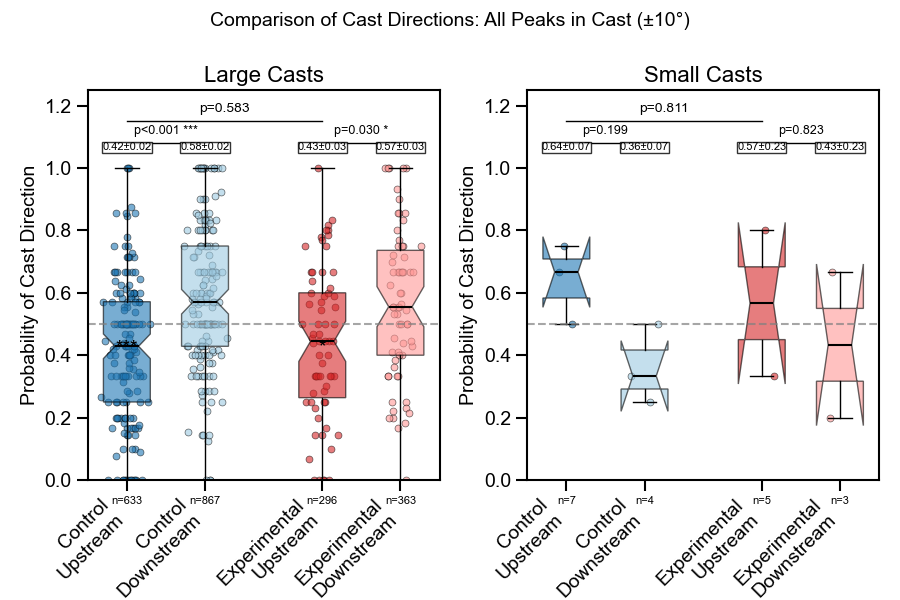

/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:586: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/Users/sharbat/miniconda3/envs/anemotaxis/lib/python3.10/site-packages/scipy/stats/_axis_nan_policy.py:430: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  return hypotest_fun_in(*args, **kwds)


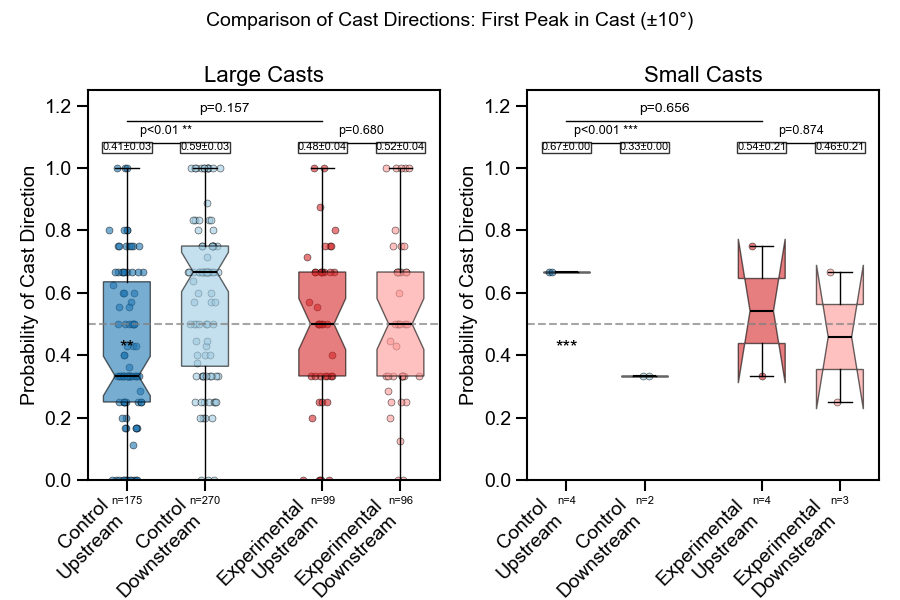

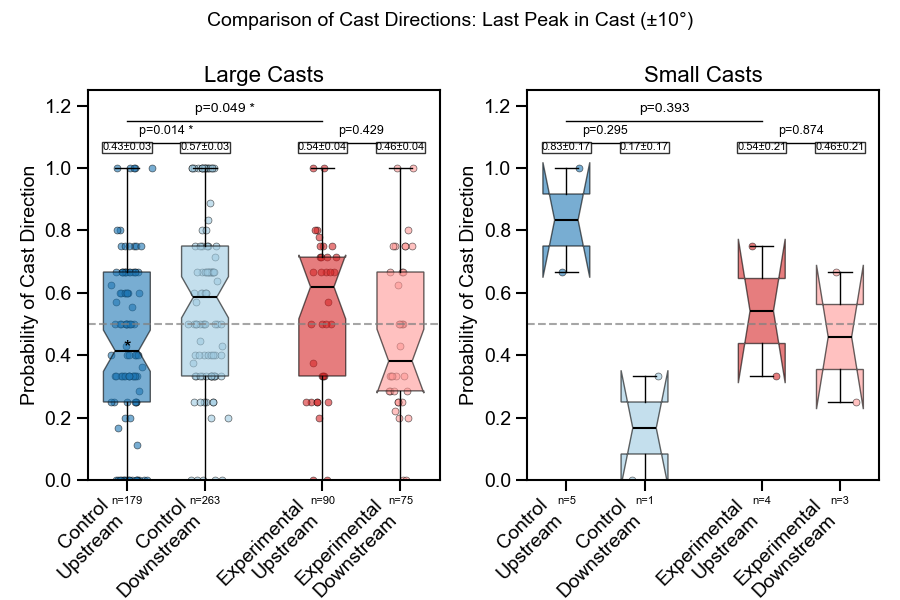

In [124]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_directions_peaks(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=10,
    smooth_window=5,
    jump_threshold=30,
    basepath=None
)

# Cast Amplitude

Analyzing Control...
Error processing larva 20240308_124423_506: ufunc 'degrees' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
Analyzing Experimental...


/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_all_peaks_Control_vs_Experimental_20250521_142703.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_all_peaks_Control_vs_Experimental_20250521_142703.svg


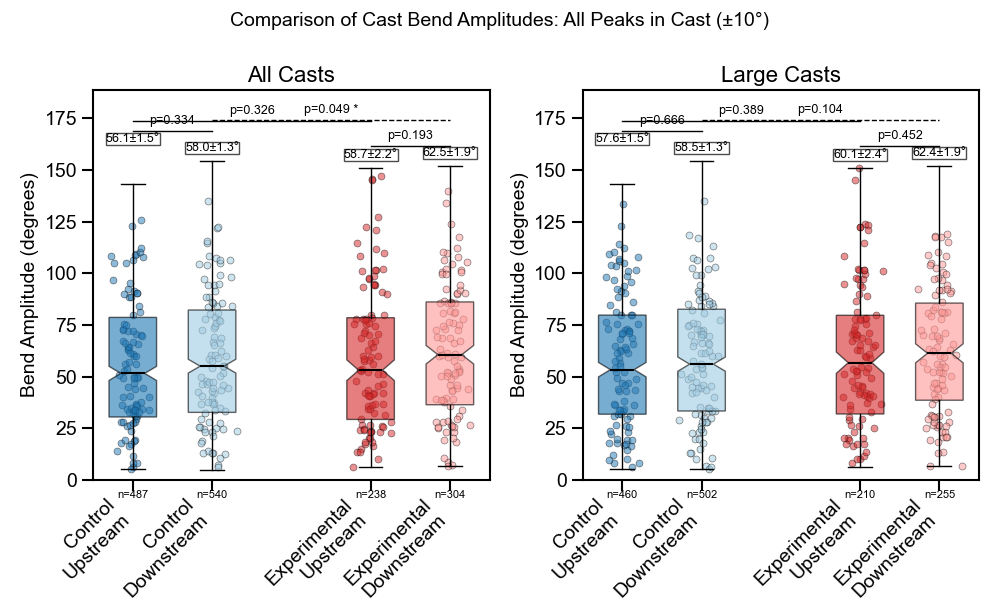

/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_first_peaks_Control_vs_Experimental_20250521_142703.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_first_peaks_Control_vs_Experimental_20250521_142703.svg


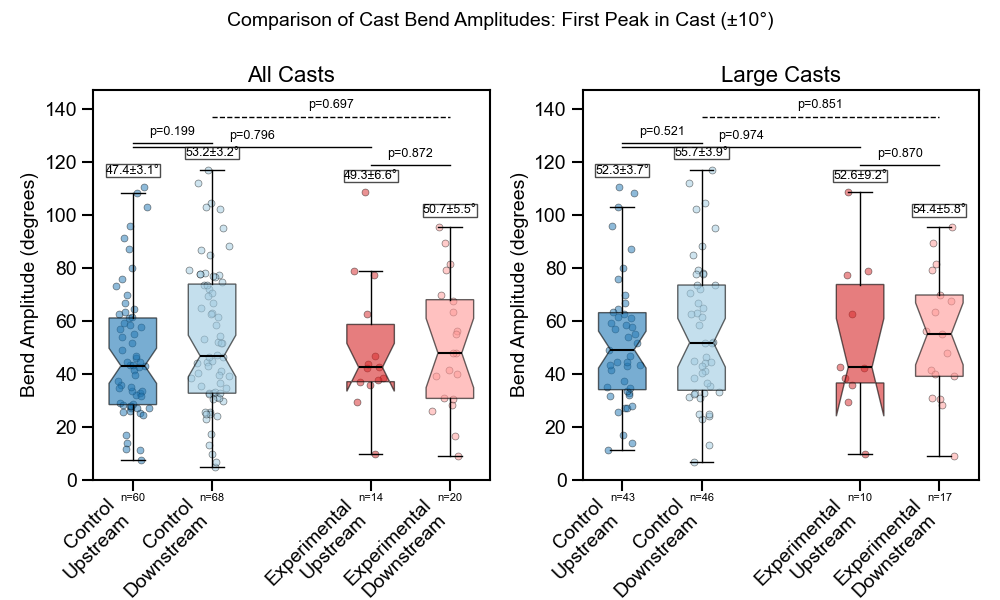

/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.
/Users/sharbat/Projects/anemotaxis/src/processor.py:12582: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "k-" (-> linestyle='-'). The keyword argument will take precedence.


Saved figure to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_last_peaks_Control_vs_Experimental_20250521_142703.png
Saved SVG to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_last_peaks_Control_vs_Experimental_20250521_142703.svg


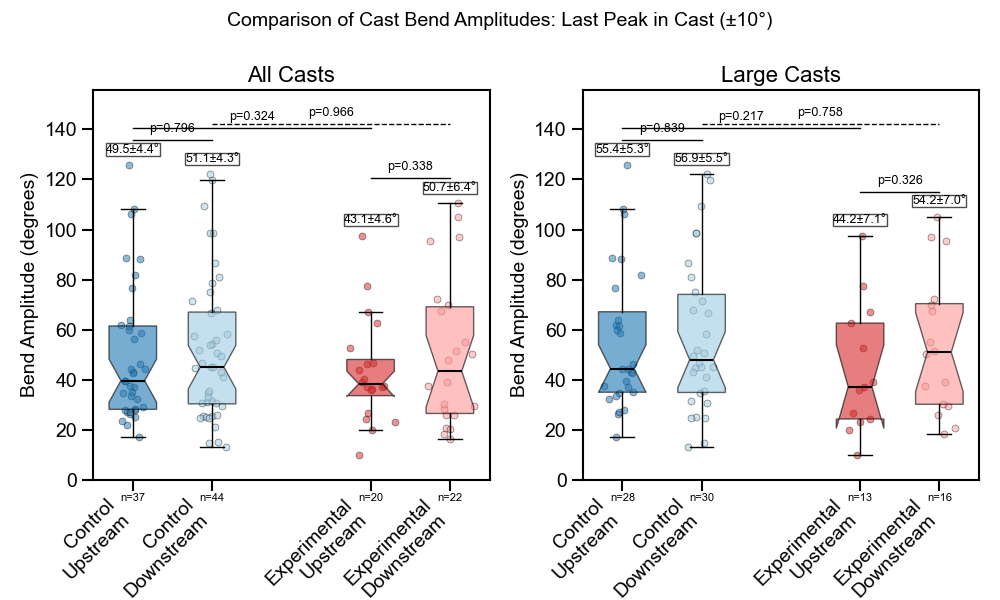

Saved statistics to: /Users/sharbat/Projects/anemotaxis/results/figures/cast_amplitude_stats_Control_vs_Experimental_20250521_142703.txt


In [107]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

amplitude_results = processor.compare_cast_amplitudes_by_direction_peaks(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=10,
    smooth_window=5,
    jump_threshold=30,
    basepath=basepath
)

In [ ]:
# Analyze all data
all_larvae_turns = processor.analyze_turn_amplitudes_by_orientation(
    filtered_all_data
)

In [ ]:
# Analyze turn rates in lateral quadrants
# lateral_stats = trx_processor.analyze_lateral_turn_rates(filtered_all_data, 
#                                          angle_width=15,
#                                          bin_width=5)

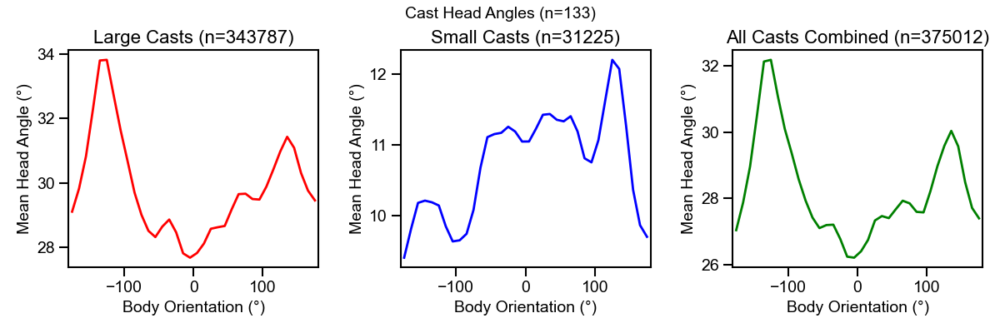

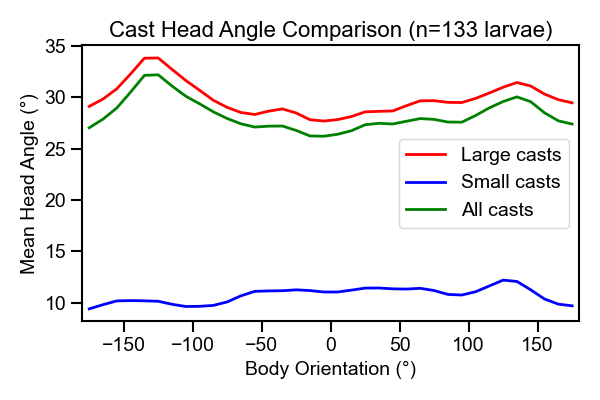

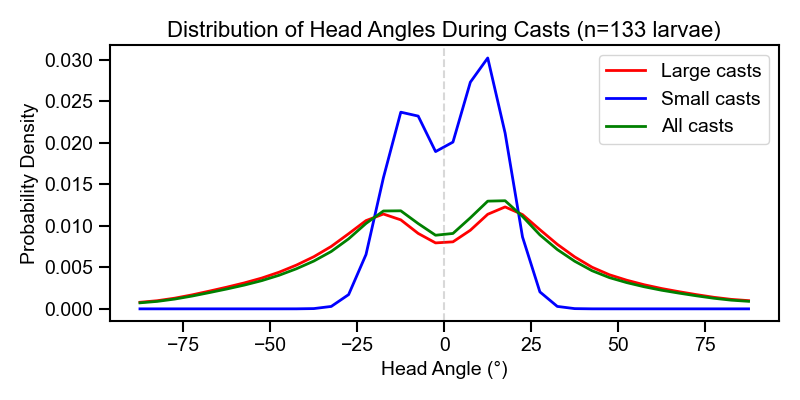

In [91]:
# Calculate head angles during cast events
head_angle_results = processor.analyze_cast_head_angles_by_orientation(filtered_all_data)

# If you want to analyze specific larvae
# single_larva_head_angles = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, larva_id="larva1")

# If you want to change bin width
# finer_bins = trx_processor.analyze_cast_head_angles_by_orientation(filtered_all_data, bin_width=5)

Analyzing Control...


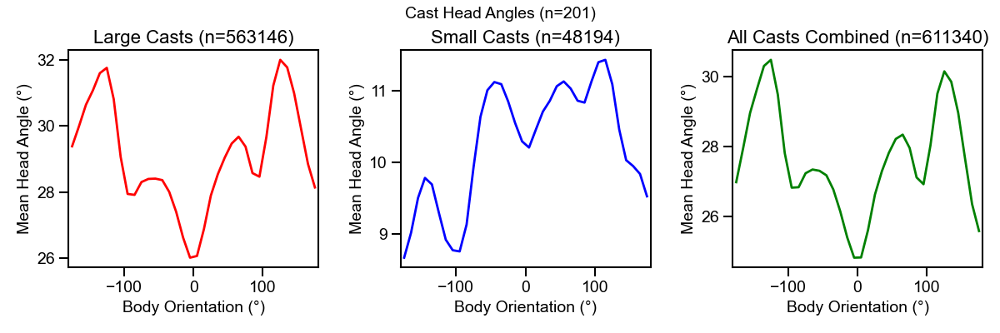

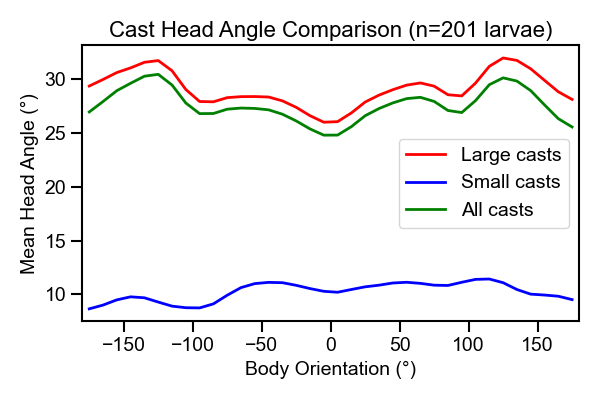

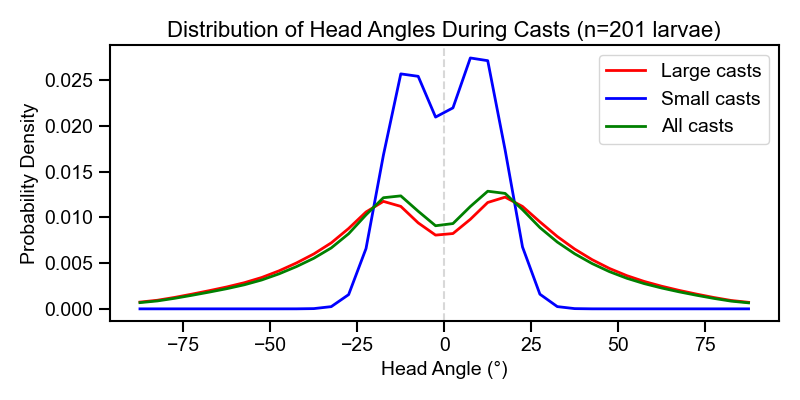

Analyzing Experimental...


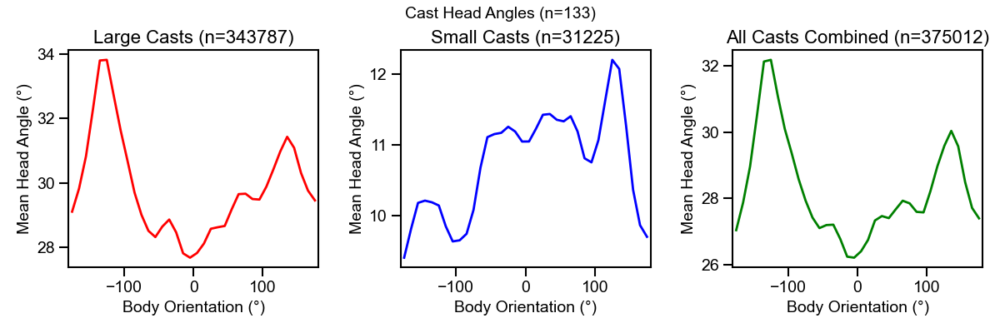

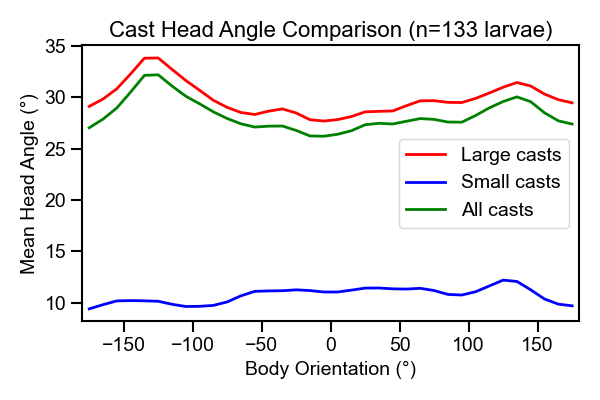

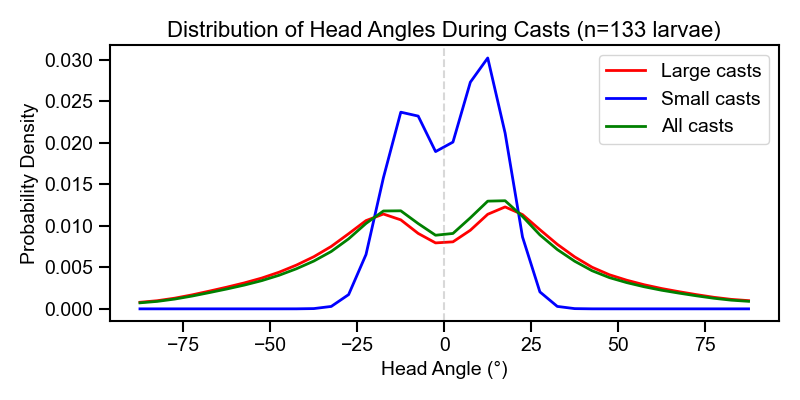

Saved comparison plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_comparison_Control_vs_Experimental_20250521_140250.svg


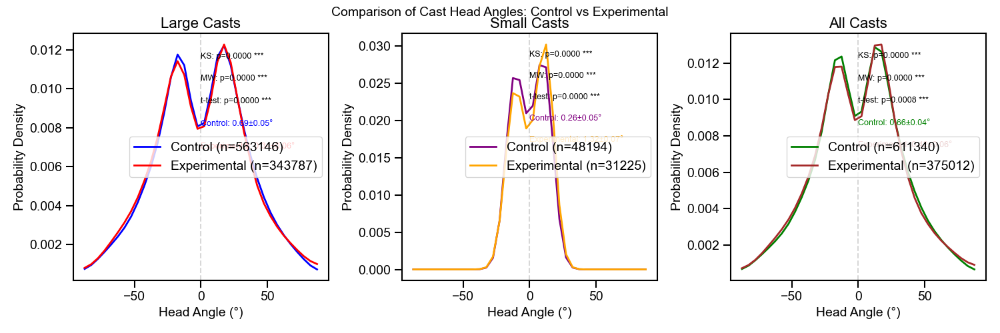

Saved boxplot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_boxplot_Control_vs_Experimental_20250521_140250.svg


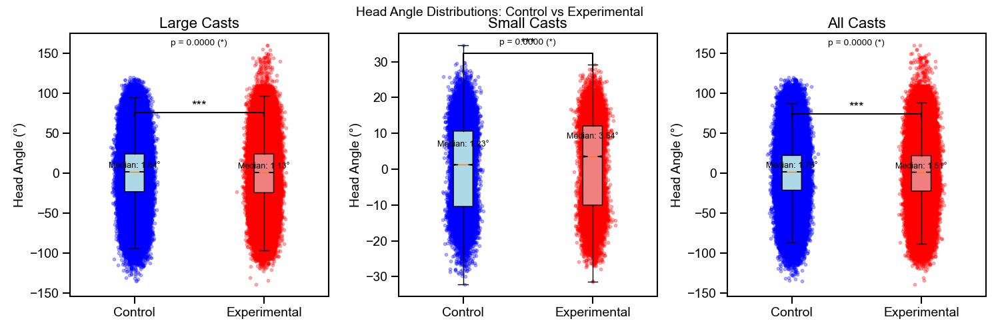

Saved orientation-dependent analysis to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_by_orientation_Control_vs_Experimental_20250521_140303.svg


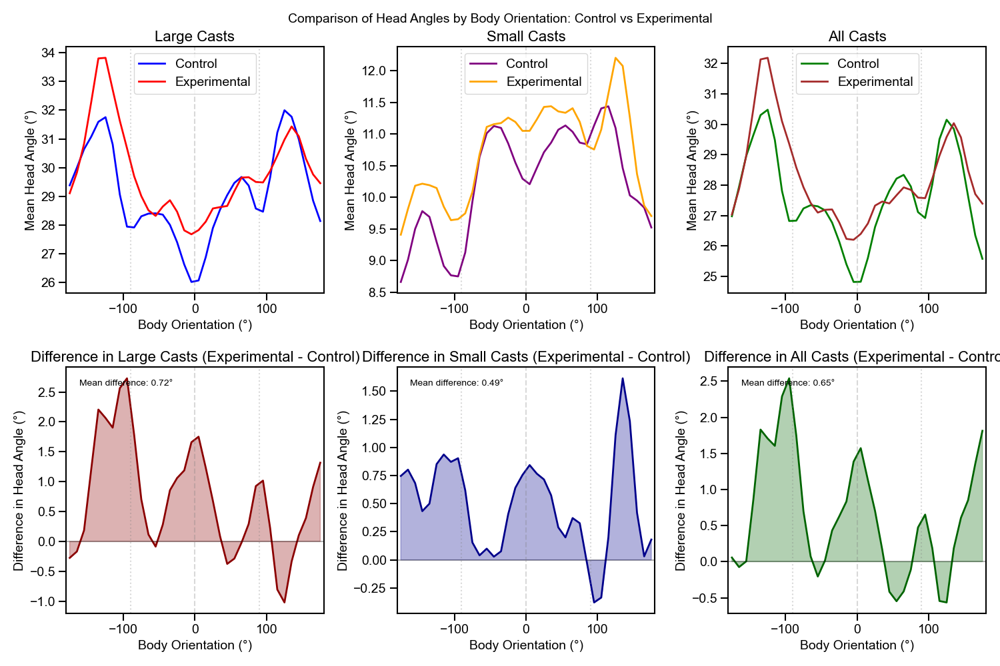


Summary of Cast Head Angle Comparison:
Comparing Control vs Experimental

Large Casts:
  Control: n=563146, mean=0.69±35.14°, median=1.84°
  Experimental: n=343787, mean=0.34±36.13°, median=1.13°
  Mean difference: -0.36°
  Median difference: -0.71°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000000 (significant)
  t-test: p=0.000004 (significant)

Small Casts:
  Control: n=48194, mean=0.26±11.47°, median=1.23°
  Experimental: n=31225, mean=1.32±11.89°, median=3.54°
  Mean difference: 1.06°
  Median difference: 2.31°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000000 (significant)
  t-test: p=0.000000 (significant)

All Casts:
  Control: n=611340, mean=0.66±33.88°, median=1.76°
  Experimental: n=375012, mean=0.42±34.77°, median=1.51°
  Mean difference: -0.24°
  Median difference: -0.25°
  Kolmogorov-Smirnov test: p=0.000000 (significant)
  Mann-Whitney U test: p=0.000001 (significant)
  t-test: p=0.000795 (significa

In [93]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_head_angles(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path  # Changed from base_path to basepath
)

Analyzing Control...


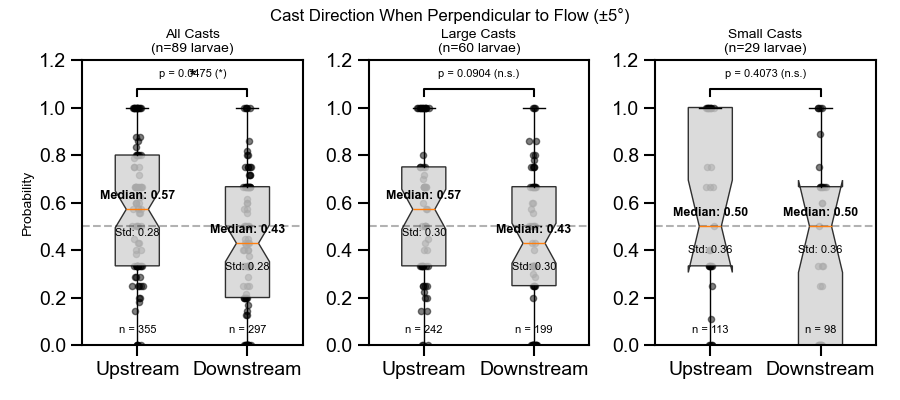

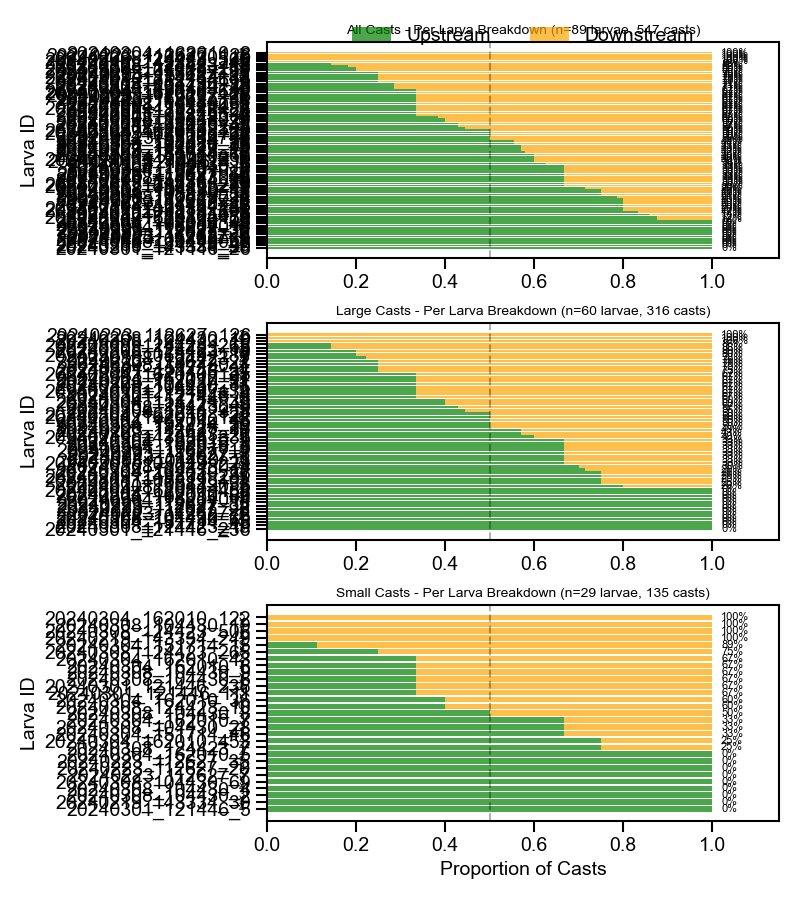


Summary of Cast Direction Analysis:
Analyzed 89 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 652 casts from 89 larvae
  Upstream: 355 (54.4%), Downstream: 297 (45.6%)
  Upstream mean: 0.561 ± 0.283 (std)
  Downstream mean: 0.439 ± 0.283 (std)
  Upstream median: 0.571
  Downstream median: 0.429
  Chi-Square Test: χ² = 5.16, p = 0.0231 (significant)
  Paired T-Test: t = 2.01, p = 0.0475 (significant)

Large Casts:
  Total: 441 casts from 60 larvae
  Upstream: 242 (54.9%), Downstream: 199 (45.1%)
  Upstream mean: 0.567 ± 0.300 (std)
  Downstream mean: 0.433 ± 0.300 (std)
  Upstream median: 0.571
  Downstream median: 0.429
  Chi-Square Test: χ² = 4.19, p = 0.0406 (significant)
  Paired T-Test: t = 1.72, p = 0.0904 (not significant)

Small Casts:
  Total: 211 casts from 29 larvae
  Upstream: 113 (53.6%), Downstream: 98 (46.4%)
  Upstream mean: 0.557 ± 0.360 (std)
  Downstream mean: 0.443 ± 0.360 (std)
  Upstream median: 0.500
  Downstream median: 0.50

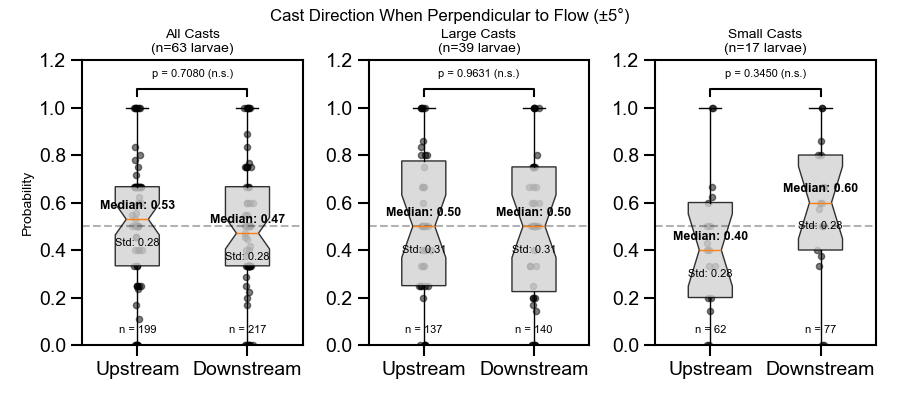

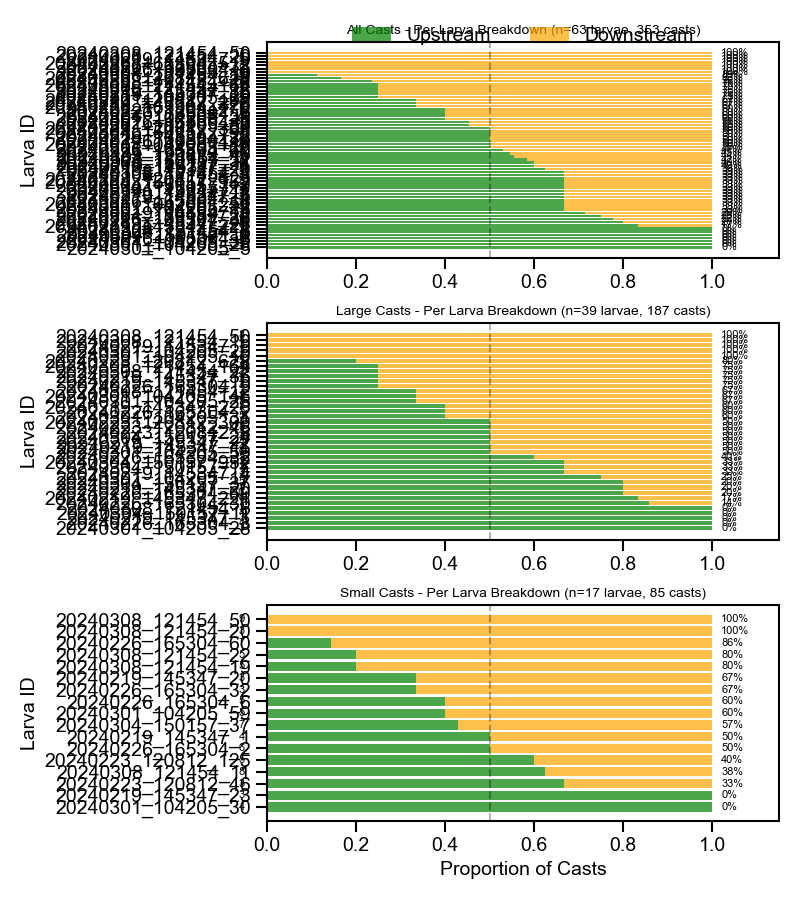


Summary of Cast Direction Analysis:
Analyzed 63 larvae with cast events during perpendicular orientation (±5°)

All Casts:
  Total: 416 casts from 63 larvae
  Upstream: 199 (47.8%), Downstream: 217 (52.2%)
  Upstream mean: 0.514 ± 0.283 (std)
  Downstream mean: 0.486 ± 0.283 (std)
  Upstream median: 0.529
  Downstream median: 0.471
  Chi-Square Test: χ² = 0.78, p = 0.3775 (not significant)
  Paired T-Test: t = 0.38, p = 0.7080 (not significant)

Large Casts:
  Total: 277 casts from 39 larvae
  Upstream: 137 (49.5%), Downstream: 140 (50.5%)
  Upstream mean: 0.502 ± 0.307 (std)
  Downstream mean: 0.498 ± 0.307 (std)
  Upstream median: 0.500
  Downstream median: 0.500
  Chi-Square Test: χ² = 0.03, p = 0.8570 (not significant)
  Paired T-Test: t = 0.05, p = 0.9631 (not significant)

Small Casts:
  Total: 139 casts from 17 larvae
  Upstream: 62 (44.6%), Downstream: 77 (55.4%)
  Upstream mean: 0.431 ± 0.283 (std)
  Downstream mean: 0.569 ± 0.283 (std)
  Upstream median: 0.400
  Downstream m

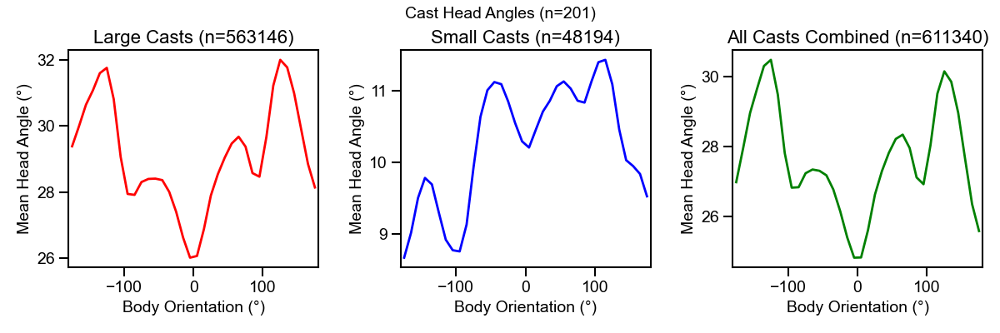

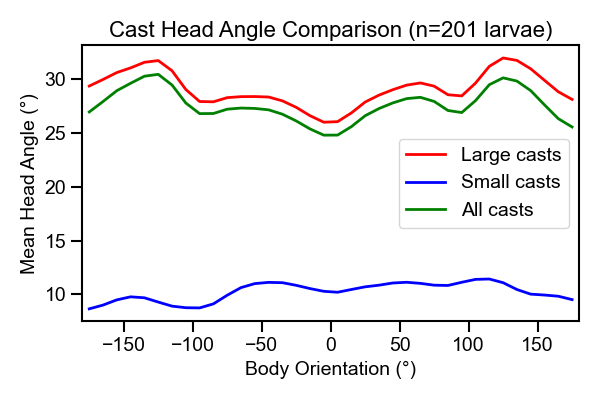

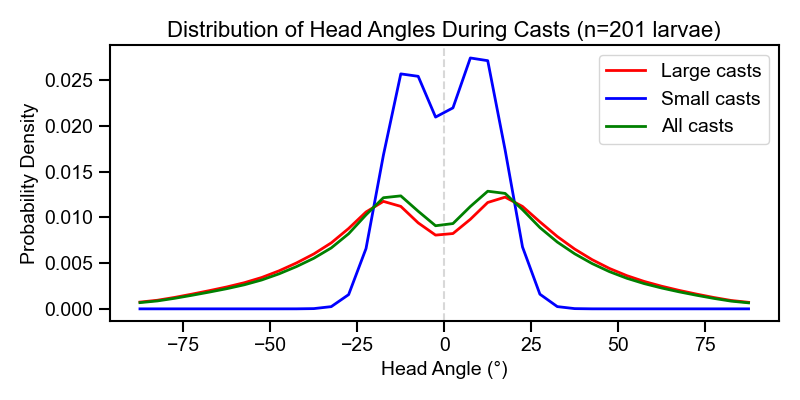

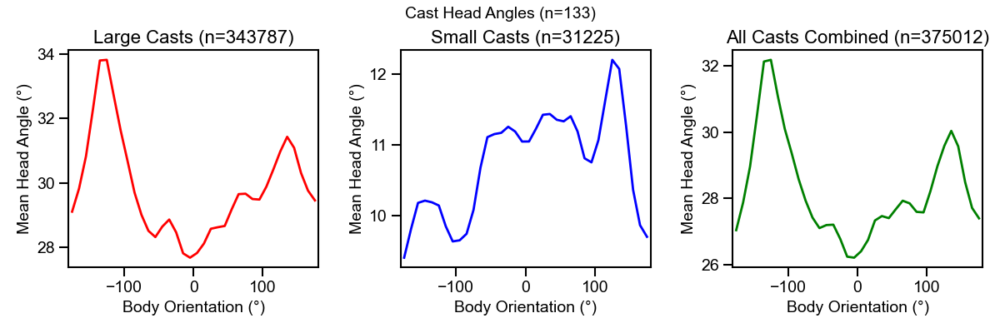

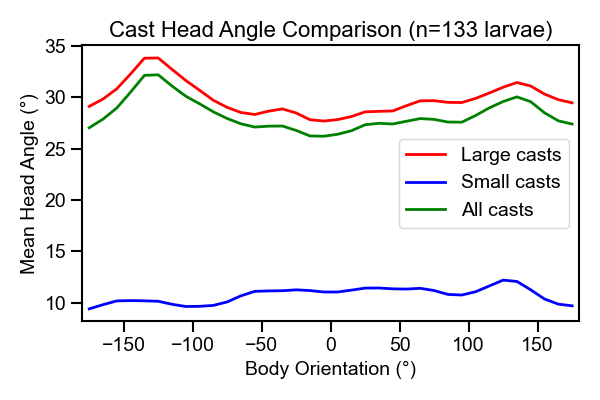

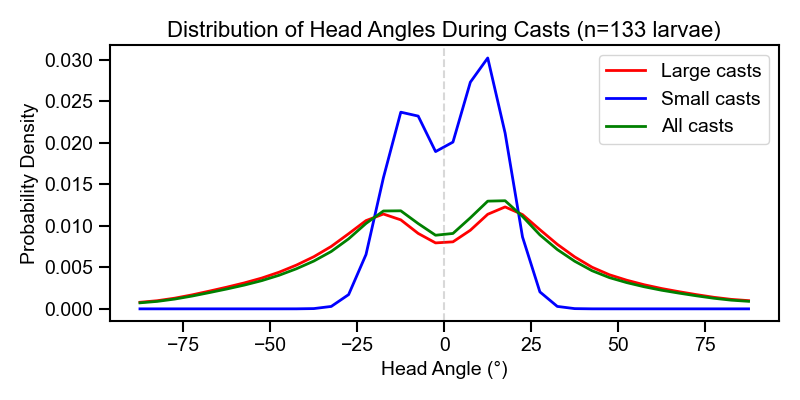

Saved head angle curves comparison to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_curves_comparison_Control_vs_Experimental_20250521_140736.svg


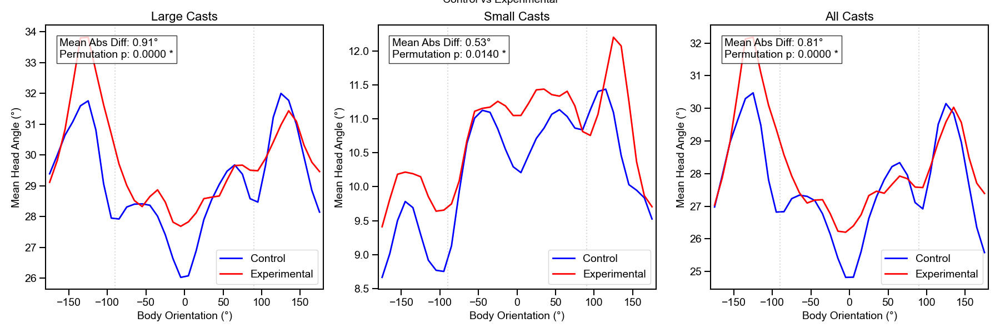

Saved head angle curves statistics to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/head_angle_curves_stats_Control_vs_Experimental_20250521_140736.txt


In [95]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_directions_new(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    basepath=base_path
)

Analyzing Control...


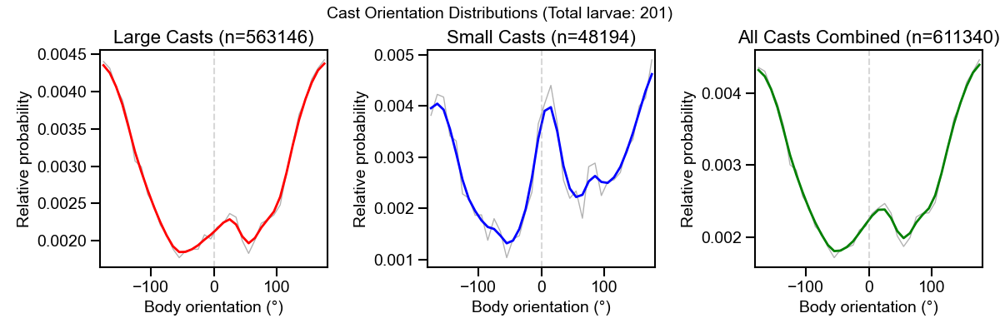

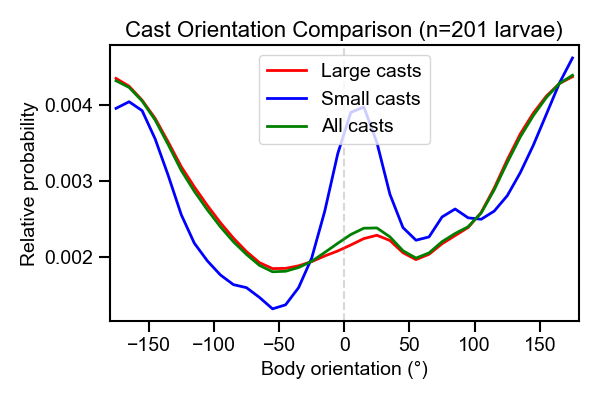

Analyzing Experimental...


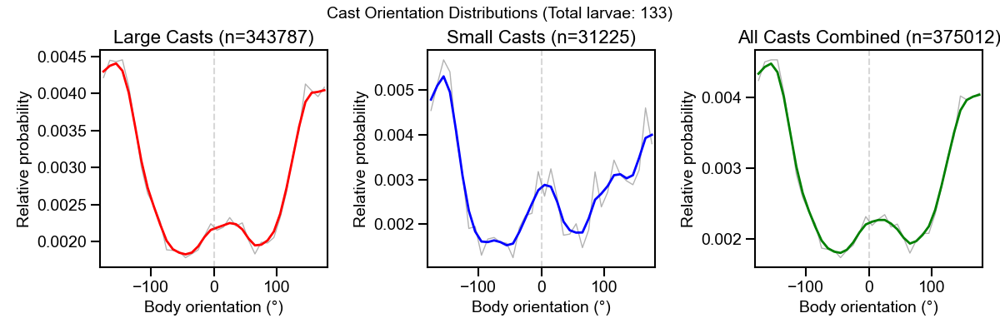

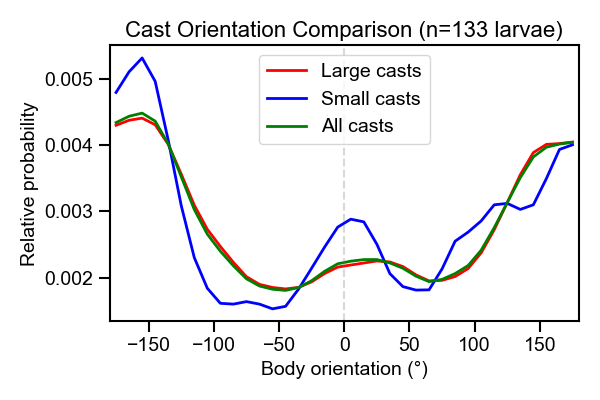

Saved comparison plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/cast_orientation_comparison_Control_vs_Experimental_20250521_140229.svg


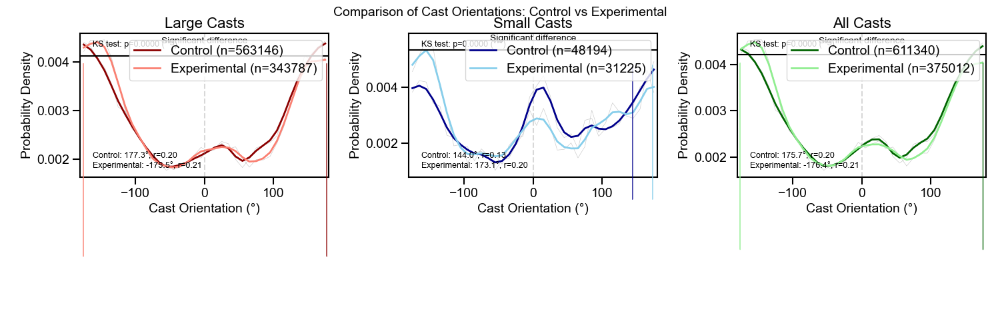

Saved circular plot to: /Users/sharbat/Projects/anemotaxis/data/GMR_SS01757@UAS_TNT_2_0003/p_5gradient2_2s1x600s0s#n#n#n/cast_orientation_circular_Control_vs_Experimental_20250521_140229.svg


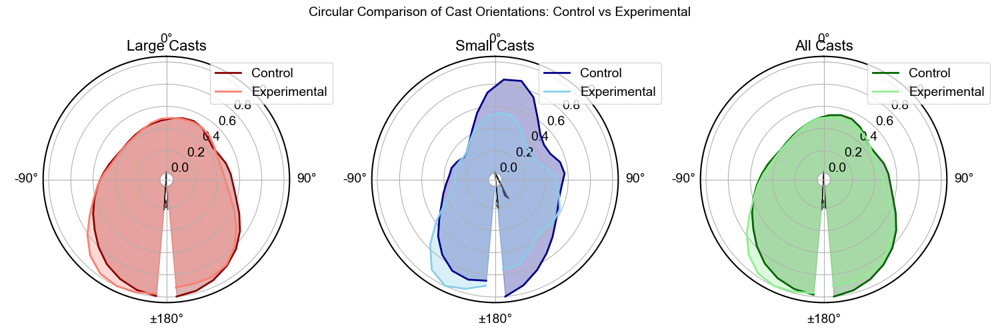


Summary of Cast Orientation Comparison:
Comparing Control vs Experimental

Large Casts:
  Control: n=563146, mean direction=177.3°, concentration=0.20
  Experimental: n=343787, mean direction=-175.5°, concentration=0.21
  Direction difference: 352.8°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

Small Casts:
  Control: n=48194, mean direction=144.0°, concentration=0.13
  Experimental: n=31225, mean direction=173.1°, concentration=0.20
  Direction difference: 29.1°
  Kolmogorov-Smirnov test: p=0.000000 (significant)

All Casts:
  Control: n=611340, mean direction=175.7°, concentration=0.20
  Experimental: n=375012, mean direction=-176.4°, concentration=0.21
  Direction difference: 352.0°
  Kolmogorov-Smirnov test: p=0.000000 (significant)


In [92]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = processor.compare_cast_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=10,
    basepath=base_path
)

In [ ]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

# Compare the datasets with custom labels and save output
basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_run_orientations(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    bin_width=12,
    basepath=base_path
)

In [ ]:
# Analyze cast directions relative to wind
cast_stats = trx_processor.analyze_perpendicular_cast_directions_new(filtered_all_data, angle_width=5, min_frame=3, basepath=base_path)

In [ ]:
# Example usage:
control_data = filtered_all_data_control
experimental_data = filtered_all_data

basepath = "/Users/sharbat/Projects/anemotaxis/results/figures"
os.makedirs(basepath, exist_ok=True)

comparison_results = trx_processor.compare_cast_directions_perpendicular(
    control_data, 
    experimental_data, 
    labels=('Control', 'Experimental'),
    angle_width=3,
    min_frame=3,
    basepath=basepath
)

In [ ]:
# # Or let the function pick a random larva with good data
# results = trx_processor.analyze_cast_head_dynamics(filtered_all_data)


# # Print the statistics
# print(f"Analysis for larva {results['larva_id']}:")
# print(f"Number of cast events: {results['n_events']}")
# print(f"Mean cast duration: {results['mean_duration']:.3f}s")
# print(f"Mean max downer-upper angle: {results['mean_max_angle_du']:.2f} degrees")
# print(f"Mean max bend angle: {results['mean_max_bend_angle']:.2f} degrees")
# print(f"Mean bend amplitude during casts: {results['mean_bend_amplitude']:.2f} degrees")

In [ ]:
# # Import libraries
# import numpy as np
# import matplotlib.pyplot as plt
# from src import trx_processor

# # Apply the analysis function
# results = trx_processor.analyze_perpendicular_cast_directions(filtered_all_data, angle_width=45)

# # Print summary statistics
# print(f"Analysis completed for {results['larvae_processed']} larvae")
# print(f"Total casts analyzed: {sum(results['total_counts'].values())}")

# # Print probabilities
# print("\nCast Direction Probabilities:")
# print(f"  Upstream: {results['probabilities']['upstream']:.3f} ({results['total_counts']['upstream']} casts)")
# print(f"  Downstream: {results['probabilities']['downstream']:.3f} ({results['total_counts']['downstream']} casts)")

# # Print statistical results
# chi2, p_chi2 = results['chi2_result']
# significance = "*" * sum([p_chi2 < threshold for threshold in [0.05, 0.01, 0.001]])
# print(f"\nChi-square test results:")
# print(f"  chi2: {chi2:.4f}")
# print(f"  p-value: {p_chi2:.4f} {significance}")

# # Add t-test results if available
# if results['ttest_result'] is not None:
#     t_stat, p_val = results['ttest_result']
#     significance = "*" * sum([p_val < threshold for threshold in [0.05, 0.01, 0.001]])
#     print(f"\nPaired t-test results:")
#     print(f"  t-statistic: {t_stat:.4f}")
#     print(f"  p-value: {p_val:.4f} {significance}")

In [ ]:
trx_processor.plot_angle_timeseries_with_polar(filtered_extracted_data, larva_id=first_larva, smooth_window=5, jump_threshold=20)

In [ ]:
# For coloring by time with a cool colormap
results = trx_processor.plot_polar_angles_scatter(
    filtered_extracted_data,
    larva_id=first_larva,
    smooth_window=50,
    jump_threshold=20,
    cmap='inferno'  # Try other colormaps: viridis, inferno, magma, cividis
)

# Or to visualize behavior states
# results_behavior = trx_processor.plot_polar_angles_scatter(
#     filtered_extracted_data,
#     larva_id=first_larva,
#     smooth_window=50,
#     jump_threshold=20,
#     color_by='behavior'
# )

In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[3]
trx_processor.plot_behavioral_contour_with_global_trajectory(filtered_extracted_data, first_larva)

In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[0]
trx_processor.plot_larva_angle_vectors(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)


In [ ]:
first_larva = sorted(filtered_extracted_data.keys())[0]
trx_processor.plot_larva_integrated_visualization(filtered_extracted_data, larva_id=first_larva, smooth_window=5, time_window=50)


In [ ]:
# Run the analysis
results = trx_processor.compare_genotype_distributions_by_date()